In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import DBSCAN
from IPython.display import display, Image

# Metropolitan Statistical Area Model

A Metropolitan Statistical Area (MSA) in the USA is defined by the Office of Management and Budget (OMB) as a "Core Based Statistical Area associated with at least one Urban Area that has a population of at least 50,000." The MSA comprises the central county or counties containing the core, plus adjacent outlying counties with a high degree of social and economic integration with the central county or counties, as measured through commuting (Section E of https://www.federalregister.gov/documents/2021/07/16/2021-15159/2020-standards-for-delineating-core-based-statistical-areas). Consequently, MSAs play a crucial role in demographic analysis, economic research, transportation development, and more. However, the determination of an "urban area" by the OMB may seem somewhat arbitrary and dependent on data that is not readily available.

In this project, we propose a generalized method for determining MSAs based on per city population and intercity distance. Instead of relying on urban areas to delineate MSAs, our approach starts by considering cities with a population greater than 50,000. This model offers several advantages:

- It is easily interpretable.
- It relies on readily available data (cities, population, latitude, longitude).
- It can be applied to countries where MSAs are not defined but would be beneficial.
- It can be easily adjusted to identify micropolitan statistical areas.

We begin by first applying the model to cities in the USA and discussing our findings. We end by applying our model to all countries in our dataset to get a world map of MSAs.

In [2]:
# load in data
df = pd.read_csv('citydata.csv')
# filter for only cities in USA
df = df[df['country'] == 'united states']
df.head()

,city,state,country,latitude,longitude,population
0,mahopac,new york,united states,41.37232,-73.73346,8369
1,seven hills,ohio,united states,41.39533,-81.67624,11690
2,new martinsville,west virginia,united states,39.64452,-80.85760,5218
6,jacksonville,oregon,united states,42.31346,-122.96699,2883
13,tigerville,south carolina,united states,35.06845,-82.36845,1312


We note that there are a total of 874 cities with a population exceeding 50,000. According to our MSA criteria, the maximum number of MSAs possible is this count. However, in practice, this figure is anticipated to be significantly lower, given that numerous large cities are in close proximity to each other and can be consolidated into a single MSA.

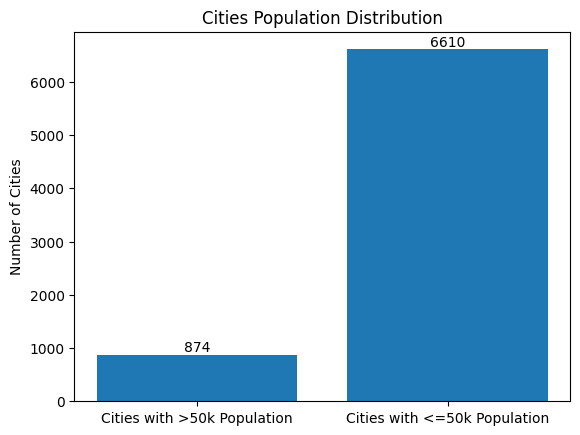

In [3]:
# Filter cities with population greater than 50k
high_population_cities = df[df['population'] > 50000]

# Plotting the bar chart
fig, ax = plt.subplots()
bars = ax.bar(['Cities with >50k Population', 'Cities with <=50k Population'],
              [len(high_population_cities), len(df) - len(high_population_cities)])

plt.ylabel('Number of Cities')
plt.title('Cities Population Distribution')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, round(yval), ha='center', va='bottom')

plt.show()


## Density-Based Spatial Clustering of Applications with Noise (DBSCAN) for MSAs

We aim to form MSAs by employing a DBSCAN model. Why DBSCAN? Unlike K-means, which focuses on minimizing variance, DBSCAN strives to minimize spatial distance—a more fitting approach for geographical data. Additionally, DBSCAN automatically excludes "outliers," a crucial step to establish well-defined MSA boundaries and prevent continuous expansion.

Given our latitude and longitude data, we calculate the haversine distance between points in our DBSCAN. Two key hyperparameters come into play: epsilon, serving as a threshold distance determining whether a city joins an MSA, and min_samples, representing the minimum number of nearby cities required to initiate MSA formation.

Choosing epsilon and min_samples requires a delicate balance. A large epsilon with a small min_samples may amalgamate distant big cities into a single MSA, while a small epsilon with a large min_samples might fail to capture meaningful MSAs.

For instance, an epsilon of 30 km and min_samples of 1 would group Los Angeles and San Diego into the same MSA, despite their considerable distance and distinct commuting patterns. On the other hand, an epsilon of 10 km with a min_samples of 10 results in no MSA for San Francisco, which is counterintuitive.

Optimizing epsilon and min_samples poses a central challenge. Our approach leans towards interpretable intuition. We opt for min_samples = 1, recognizing that the combination of a city with a population exceeding 50k, and a small town, warrant their own MSA. As for epsilon, we set it at 15 km, considering the average commute time reported by the 2019 census (27 minutes one-way) as a rough estimate, equivalent to a maximum travel distance of 15 km (source: https://www.census.gov/newsroom/press-releases/2021/one-way-travel-time-to-work-rises.html).

In [4]:
# DBSCAN clustering
dist_threshhold = 15.0  # in kilometers
min_samples = 1  # number of cities required to be near in order to consider it part of the cluster

dbscan = DBSCAN(eps=(dist_threshhold/6371), min_samples=min_samples, metric='haversine', algorithm= 'ball_tree') #/6371 converts km into haversine dist
labels = dbscan.fit_predict(np.radians([x for x in zip(df['latitude'],df['longitude'])])) #haversine distance takes radians not degrees
# Add the cluster labels to the DataFrame
df['cluster'] = labels
# Remove "-1" cluster, these cities are outliers and not part of any MSA
df_filtered = df[df['cluster'] != -1]
#Filter data so we only have MSAs (at least one city having population > 50,000)
#this part could be changed in order to define micropolitan statistical areas, 10000 < population <50000
df_filtered = df_filtered[df_filtered.groupby('cluster')['population'].transform('max') > 50000]

In [5]:
#Need to label the MSAs, Naming convention:  MSA's will be named with up to a max of 3 CORE CITIES (more than 50k population each) 
#in the name followed by state only unique entries for state are included. Ex: Atlanta-Sandy Springs-Marietta GA MSA
df_sorted = df_filtered.sort_values(by='population', ascending=False).groupby('cluster').head(3)

#Filter cities with population greater than 50,000
df_sorted = df_sorted[df_sorted['population'] > 50000]

#Group by cluster and concatenate city and state names separately, only add different states to name
msa_names_city = df_sorted.groupby('cluster')['city'].apply(lambda x: '-'.join(x)).reset_index(name='city_names')
msa_names_state = df_sorted.groupby('cluster')['state'].apply(lambda x: '-'.join(x.unique())).reset_index(name='state_names')

#Merge the city and state names back to the original DataFrame
df_with_pred_msa = pd.merge(df_filtered, msa_names_city, on='cluster', how='left')
df_with_pred_msa = pd.merge(df_with_pred_msa, msa_names_state, on='cluster', how='left')

# Combine city and state names to form 'pred-MSA' column
df_with_pred_msa['pred-MSA'] = df_with_pred_msa.apply(lambda row: f"{row['city_names']} {' '.join(row['state_names'].split())} msa", axis=1)

# If there are clusters with fewer than 3 cities meeting the criteria, fill NaN values with an empty string
df_with_pred_msa['pred-MSA'] = df_with_pred_msa['pred-MSA'].fillna('')

#Drop the intermediate columns if needed
df_with_pred_msa = df_with_pred_msa.drop(['city_names', 'state_names'], axis=1)

# Now, df_with_pred_msa contains the 'pred-MSA' column based on the specified criteria.


In [6]:
# Sort each group by population in descending order
df_sorted = df_filtered.sort_values(by='population', ascending=False).groupby('cluster').head(3)

# Filter cities with population greater than 50,000
df_sorted = df_sorted[df_sorted['population'] > 50000]

# Group by cluster and concatenate city and state names separately
msa_names_city = df_sorted.groupby('cluster')['city'].apply(lambda x: '-'.join(x)).reset_index(name='city_names')
msa_names_state = df_sorted.groupby('cluster')['state'].apply(lambda x: '-'.join(x.unique())).reset_index(name='state_names')

# Merge the city and state names back to the original DataFrame
df_with_pred_msa = pd.merge(df_filtered, msa_names_city, on='cluster', how='left')
df_with_pred_msa = pd.merge(df_with_pred_msa, msa_names_state, on='cluster', how='left')

# Combine city and state names to form 'pred-MSA' column
df_with_pred_msa['pred-MSA'] = df_with_pred_msa.apply(lambda row: f"{row['city_names']} {' '.join(row['state_names'].split())} msa", axis=1)

# If there are clusters with fewer than 3 cities meeting the criteria, fill NaN values with an empty string
df_with_pred_msa['pred-MSA'] = df_with_pred_msa['pred-MSA'].fillna('')

# Drop the intermediate columns if needed
df_with_pred_msa = df_with_pred_msa.drop(['city_names', 'state_names'], axis=1)

# Drop the 'cluster' column
df_with_pred_msa = df_with_pred_msa.drop('cluster', axis=1)

# Predicted MSA vs OMB MSA

In [7]:
selected_cities = ['los angeles', 'new york', 'chicago', 'san diego', 'jacksonville', 'san francisco'] 

# Filter the DataFrame for the selected cities
df_with_pred_msa[df_with_pred_msa['city'].isin(selected_cities)]

,city,state,country,latitude,longitude,population,pred-MSA
2,jacksonville,oregon,united states,42.31346,-122.96699,2883,medford oregon msa
1088,jacksonville,north carolina,united states,34.75405,-77.43024,67357,jacksonville north carolina msa
2565,jacksonville,arkansas,united states,34.86620,-92.11015,28643,little rock-north little rock arkansas msa
3251,chicago,illinois,united states,41.85003,-87.65005,2720546,chicago-milwaukee-aurora illinois-wisconsin msa
3434,los angeles,california,united states,34.05223,-118.24368,3971883,los angeles-long beach-anaheim california msa
3549,jacksonville,florida,united states,30.33218,-81.65565,949611,jacksonville florida msa
3604,san diego,california,united states,32.71571,-117.16472,1394928,san diego-chula vista-oceanside california msa
3910,san francisco,california,united states,37.77493,-122.41942,864816,san jose-san francisco-oakland california msa


We proceed to compare some of our predicted MSAs with the officially determined MSAs by the OMB as of 2020. Our model predicts a total of 280 unique MSAs, whereas the government designates 387 MSAs (https://www.census.gov/data/tables/time-series/demo/popest/2020s-total-metro-and-micro-statistical-areas.html#v2022). This discrepancy likely stems from the variation in how they define an urban area and socioeconomic ties, as discussed at the outset of this notebook.

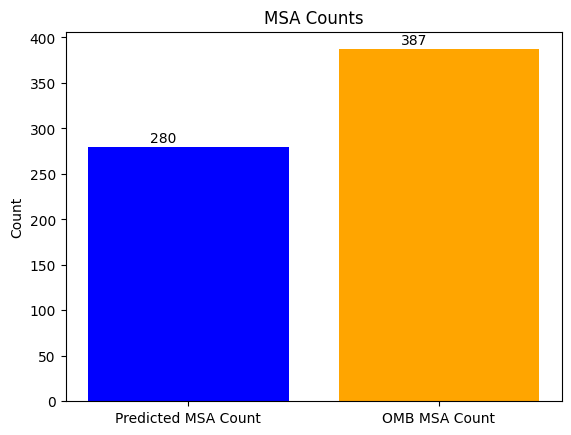

In [8]:
unique_msa_count = len(df_with_pred_msa['pred-MSA'].unique())
govt_count = 387 

labels = ['Predicted MSA Count', 'OMB MSA Count']
values = [unique_msa_count, govt_count]

fig, ax = plt.subplots()

bars = plt.bar(labels, values, color=['blue', 'orange'])

for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.1, bar.get_height() + 5, str(value), ha='center', color='black')

plt.ylabel('Count')
plt.title('MSA Counts')
plt.show()


We observe both precise matches and divergences in our predicted MSAs when compared to the officially labeled OMB MSAs. For instance, we predict the "Los Angeles-Long Beach-Anaheim California MSA," aligning perfectly with the OMB's designation.

In certain instances, our predicted MSAs encompass a larger geographical area, exemplified by the predicted "San Jose-San Francisco-Oakland California MSA," as opposed to the OMB's "San Francisco-Oakland-Berkeley" MSA. Determining which result is "more correct" becomes a subjective matter, particularly for individuals familiar with the region.

Moreover, there are cases where our predicted MSA covers a similar geographical area but differs in nomenclature compared to the OMB MSA. Notably, our predicted "New York-Brooklyn-Queens New York MSA" contrasts with the OMB's "New York-Newark-Jersey City" MSA, a discrepancy that could potentially be rectified by not counting boroughs as distinct cities in our dataset.

Lastly, we see that our model does not predict the "Burlington-South Burlington Vermont MSA." Both of these cities have less than 50,000 population individually but the OMB designates it an ubran area and therefore an MSA.

Refer to the maps below for specific visual comparisons!

## OMB USA MSA Map

Refer to README to see image or download "GovtMSAs.png" in the repo. Can't display or GitHub won't render notebook.

In [9]:
# Specify the path to your PNG file
#image_path = 'GovtMSAs.png'

#display(Image(filename=image_path))

## DBSCAN Predicted USA-World MSA Map (Interactive)

Cities integrated into an MSA are denoted by ticker symbols on the map below. Explore by zooming in and clicking on a ticker to unveil information about the specific MSA to which the city belongs.

# MSAs for Other Countries

The entire code provided earlier has been encapsulated into functions residing within a script named "msa_functions.py." We present the outcomes of applying this model to other countries lacking MSAs. It is crucial to emphasize that I calibrated the epsilon parameter in the DBSCAN using the USA census average of a 27-minute commute time. Users have the flexibility to select an appropriate intercity distance metric for a country based on alternative criteria by adjusting this parameter within the "dbscan_clustering" function. See map below for a World MSA map.

In [10]:
from msa_functions import load_data, filter_cities_by_country, filter_high_population_cities, plot_population_distribution, dbscan_clustering, label_msas, save_to_csv, create_folium_map

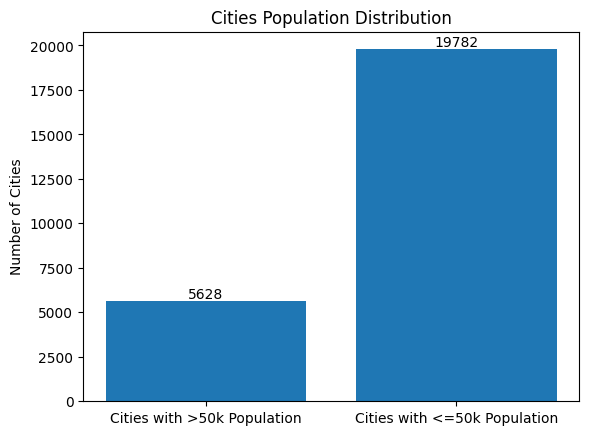

In [11]:
# Load data
file_path = 'citydata.csv'
df = load_data(file_path)

# Filter cities by country if necessary
#df = filter_cities_by_country(df, country='france')

# Filter high population cities
df_high_pop = filter_high_population_cities(df, population_threshold=50000)

# Plot population distribution
plot_population_distribution(df_high_pop, df)

# DBSCAN clustering
df_filtered = dbscan_clustering(df)

# Label MSAs
df_with_pred_msa = label_msas(df_filtered)

# Save to CSV
#save_to_csv(df_with_pred_msa, file_path='predicted_msa.csv')

# Create Folium Map
map_country = create_folium_map(df_with_pred_msa)

# Display the map
map_country


# Key Takeaways

Defining Metropolitan Statistical Areas is crucial as they offer valuable insights for diverse research and analyses. The current method employed by the Office of Management and Budget for MSA determination in the USA involves complex procedures and relies on data that may not be easily accessible. In response, we introduce a generalized model designed to identify MSAs using readily available data. The model hinges on two easily interpretable parameters: intercity distance and the minimum number of cities required to qualify as an MSA. Notably, our model produces sensible and practical outcomes.

This adaptable approach is not confined to the United States but can also be extended to other countries lacking established MSAs, proving exceptionally beneficial in their utilization as a foundation for socioeconomic analysis.